# Magic Card Generator

![architecture](architecture_static.png)

# Illustration Generator

In [1]:
import os
from openai import OpenAI

In [2]:
#os.environ["OPENAI_API_KEY"] = ""

In [3]:
def generate_image(prompt, model):
    client = OpenAI()

    response = client.images.generate(
        model=model,
        prompt=prompt,
        n=1,
        size="1024x1024"
    )

    return response

In [4]:
generate_image("Dragon", "dall-e-2")

ImagesResponse(created=1717471514, data=[Image(b64_json=None, revised_prompt=None, url='https://oaidalleapiprodscus.blob.core.windows.net/private/org-23FrZymmDbPbxlMqOxlcxAtQ/user-PXhpx1FUxch0vSQqrU0tVSFZ/img-tu9uyeYvp4FjxgcTHD6wGUYD.png?st=2024-06-04T02%3A25%3A14Z&se=2024-06-04T04%3A25%3A14Z&sp=r&sv=2023-11-03&sr=b&rscd=inline&rsct=image/png&skoid=6aaadede-4fb3-4698-a8f6-684d7786b067&sktid=a48cca56-e6da-484e-a814-9c849652bcb3&skt=2024-06-04T00%3A31%3A16Z&ske=2024-06-05T00%3A31%3A16Z&sks=b&skv=2023-11-03&sig=CVsEb8mKFE14CYV4nG%2BaG/OaYoBE3a0cfCHrvNRISUY%3D')])

In [5]:
generate_image("Dragon", "dall-e-3")

ImagesResponse(created=1717471548, data=[Image(b64_json=None, revised_prompt="Create an image of a grand, mythical creature known as a dragon. It possesses large, rustling wings and a body covered in shimmering, emerald-green scales. The dragon's eyes glow with an electrifying shade of amethyst, while smoke and sparkles of bright fire escape playfully from its snout. The dragon is seen perched on a towering mountain, with the scenic vista of a setting sun painting the sky with shades of crimson and orange. The dazzling light reflects on the scattered sea below — an enchanting spectacle that complements the majestic spectacle of the dragon.", url='https://oaidalleapiprodscus.blob.core.windows.net/private/org-23FrZymmDbPbxlMqOxlcxAtQ/user-PXhpx1FUxch0vSQqrU0tVSFZ/img-VXcaesqrhRPkpdysWw70zDXc.png?st=2024-06-04T02%3A25%3A48Z&se=2024-06-04T04%3A25%3A48Z&sp=r&sv=2023-11-03&sr=b&rscd=inline&rsct=image/png&skoid=6aaadede-4fb3-4698-a8f6-684d7786b067&sktid=a48cca56-e6da-484e-a814-9c849652bcb3&sk

In [4]:
from io import BytesIO
from PIL import Image #pip install Pillow
import requests #pip install requests


In [5]:
def get_card_illustration(card_name):
    img_metadata = generate_image(card_name, "dall-e-3")
    img_url = img_metadata.data[0].url
    card_image = Image.open(BytesIO(requests.get(img_url).content))
    return card_image

In [8]:
illustration = get_card_illustration("Dragon")

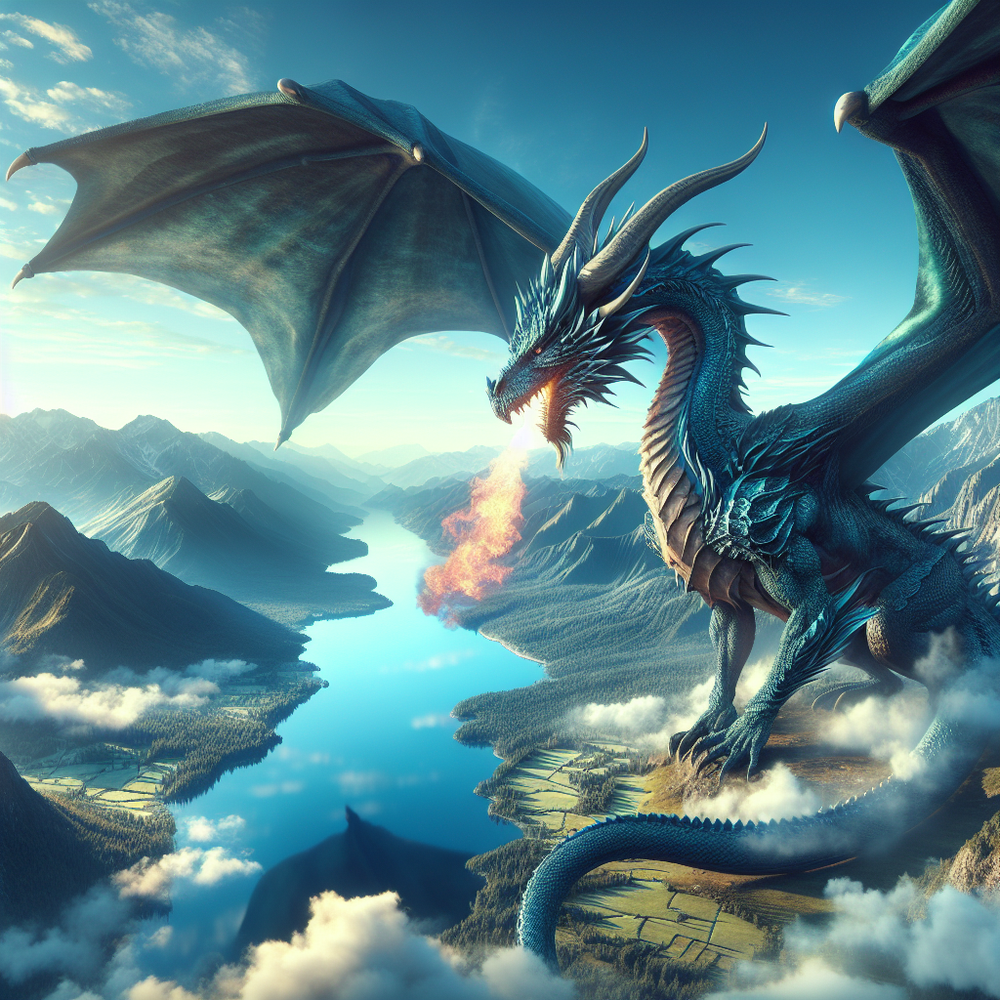

In [9]:
illustration

# Parameters Generator

![anatomy](anatomy.png)

In [6]:
import json

In [7]:
def generate_json_object(message, system_message="", temperature=0):

    client = OpenAI()

    response = client.chat.completions.create(
        model="gpt-3.5-turbo",
        response_format={"type": "json_object"},
        temperature=temperature,
        messages=[
            {"role": "system", "content": system_message + " You will generate answer in json format."},
            {"role": "user", "content": message}
        ]
    )

    return json.loads(response.choices[0].message.content)

In [14]:
generate_json_object("Give me windows 11 specifications")

{'Operating System': 'Windows 11',
 'Processor': '1 gigahertz (GHz) or faster with 2 or more cores on a compatible 64-bit processor or system on a chip (SoC)',
 'RAM': '4 GB RAM or more',
 'Storage': '64 GB or larger storage device',
 'Graphics Card': 'DirectX 12 compatible graphics / WDDM 2.x',
 'Display': '>9” with HD Resolution (720p)',
 'Internet Connection': 'Internet connectivity is necessary to perform updates and to download and take advantage of some features',
 'Other': 'Some features may require specialized hardware, see detailed system requirements at the official Windows 11 website'}

In [8]:
def get_card_parameters(card_name):

    card_parameters = generate_json_object(f"""
        For the given card name "{card_name}", generate the following Magic the Gathering card parameters in json format:

        {{
            "name": string,
            "color": lower case string,
            "cost": a list of letters or numbers,
            "power": integer,
            "toughness": integer,
            "type": string,
            "text": string,
            "flavor_text": string,
            "non_creature": boolean
        }}
    
    
    """, system_message="You are a Magic the Gathering Card generator.", temperature=0)

    return card_parameters

In [16]:
card_parameters = get_card_parameters("Dragon")

In [17]:
card_parameters

{'name': 'Dragon',
 'color': 'red',
 'cost': ['4', 'R'],
 'power': 5,
 'toughness': 5,
 'type': 'Creature - Dragon',
 'text': 'Flying',
 'flavor_text': "Beware the fury of the dragon's flame.",
 'non_creature': False}

# Render Images

In [9]:
from PIL import ImageDraw

In [10]:
def draw_rectangle(image, x, y, width, height, color):
    image = image.copy()
    draw = ImageDraw.Draw(image)

    x1 = x
    y1 = y
    x2 = x + width
    y2 = y + height

    draw.rectangle((x1, y1, x2, y2), fill=color)

    return image

# Load Blank Card

<img src="assets/images/cards/green_card.jpg" width="200"> <img src="assets/images/cards/green_card_creature.jpg" width="200"> <img src="assets/images/cards/blue_card.jpg" width="200"> <img src="assets/images/cards/blue_card_creature.jpg" width="200">

In [11]:
def load_blank_card(color, non_creature):
    if color not in ["white", "blue", "black", "red", "green"]:
        color = "white"

    if non_creature:
        filename = f"assets/images/cards/{color}_card.jpg"
    else:
        filename = f"assets/images/cards/{color}_card_creature.jpg"

    blank_card = Image.open(filename).convert("RGB")

    return blank_card

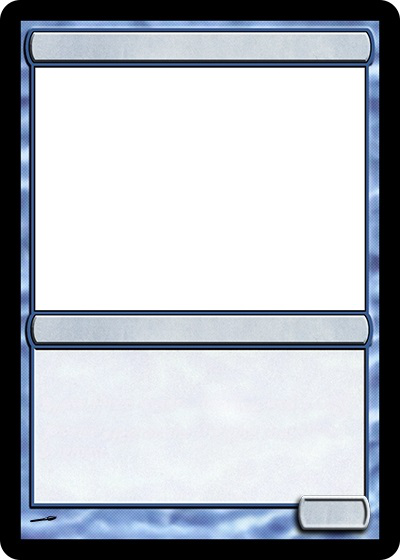

In [12]:
load_blank_card("blue", non_creature=False)

<img src="assets/images/manas/G.png" width="50"><img src="assets/images/manas/B.png" width="50"><img src="assets/images/manas/P.png" width="50"><img src="assets/images/manas/U.png" width="50"><img src="assets/images/manas/1.png" width="50"><img src="assets/images/manas/2.png" width="50"><img src="assets/images/manas/5.png" width="50">

In [13]:
def paste_image(source_image, target_image, x, y, mask):
    target_image = target_image.copy()
    target_image.paste(source_image, (x, y), mask)
    return target_image

In [14]:
def draw_manas(card, manas):

    for i, mana in enumerate(reversed(manas)):
        mana_filename = f"assets/images/manas/{mana}.png"
    
        try:
            mana_image = Image.open(mana_filename).resize((17,17))
            card = paste_image(source_image=mana_image, target_image=card, x=345-i*19, y=38, mask=mana_image)
    
        except FileNotFoundError:
            pass
    
    return card

In [15]:
card = load_blank_card("blue", False)

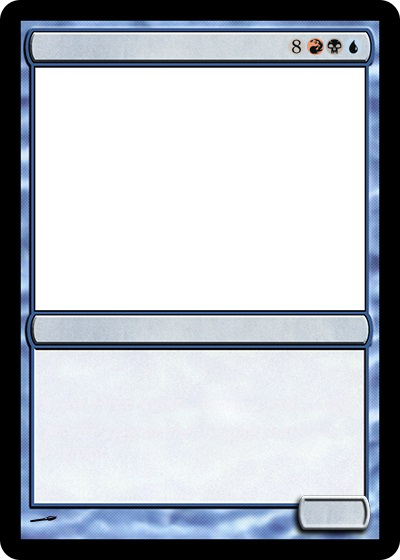

In [16]:
draw_manas(card, ["8", "R", "B", "U"])

# Inserting Illustration

In [17]:
def insert_illustration(card, illustration):
    illustration = illustration.convert("RGB").resize((329, 242))
    card = paste_image(source_image=illustration, target_image=card, x=35, y=68, mask=None)
    return card

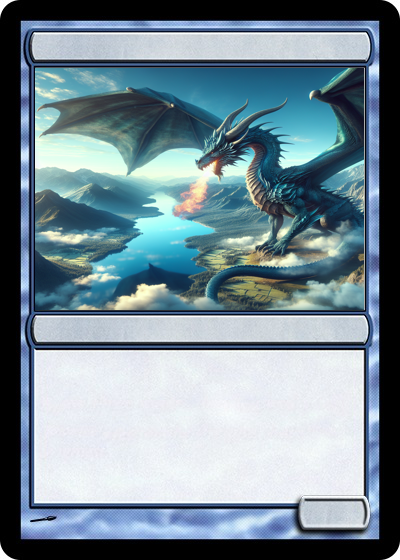

In [66]:
insert_illustration(card, illustration)

# Render Text

In [18]:
from PIL import ImageFont

def write_text(image, text, font, x, y):
    image = image.copy()
    draw = ImageDraw.Draw(image)
    draw.text((x, y), text, font=font, fill='black')
    return image

In [19]:
def write_card_name(card, name):
    card = write_text(image=card, text=name, font=ImageFont.truetype("assets/fonts/title_type.ttf", 20), x=40, y=38)
    return card

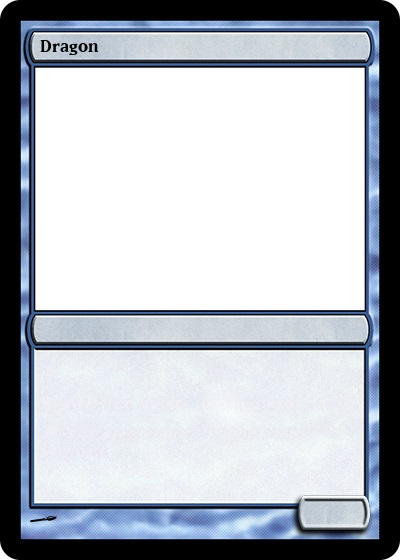

In [20]:
write_card_name(card, "Dragon")

In [21]:
def write_card_type(card, type):
    card = write_text(image=card, text=type, font=ImageFont.truetype("assets/fonts/title_type.ttf", 18), x=40, y=322)
    return card

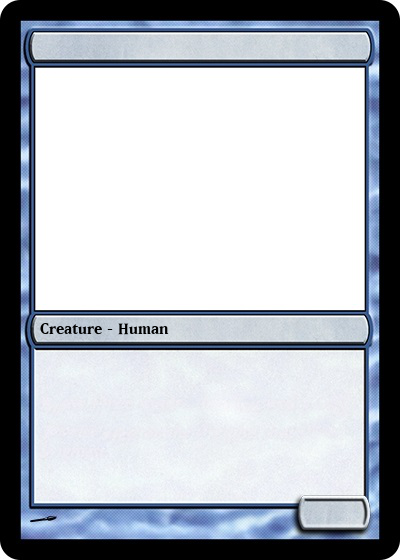

In [22]:
write_card_type(card, "Creature - Human")

# Writing Multiline text

In [23]:
lorem = "Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum."

print(lorem)

Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.


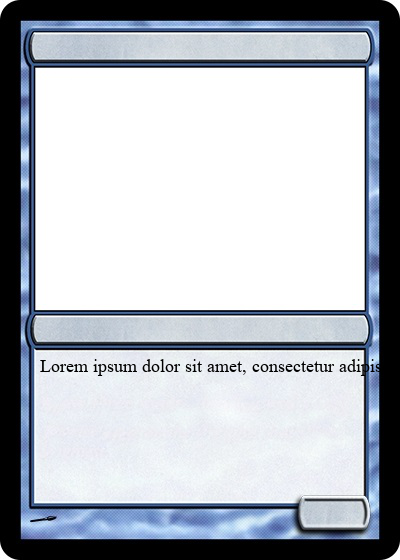

In [24]:
write_text(
    image=card, 
    text=lorem, 
    font=ImageFont.truetype("assets/fonts/text.ttf", 18), 
    x=40, y=355
)

## Problems with text/flavor text area of the card

- Text need to be centered (vertically and horizontally)
- Text may have more than online (multiline text)
- Text area must be divided between ability text and flavor text

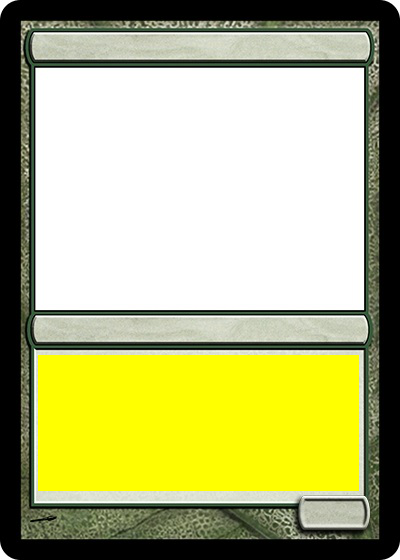

In [25]:
test_card = load_blank_card("green", False)

text_area_x = 38
text_area_y = 355

text_area_width = 320
text_area_height = 135

draw_rectangle(test_card, x=text_area_x, y=text_area_y, width=text_area_width, height=text_area_height, color="yellow")

In [26]:
def get_text_width(text, font):
    draw = ImageDraw.Draw(Image.new("RGB", (0, 0)))
    return draw.textlength(text, font=font)

In [27]:
text_font = ImageFont.truetype("assets/fonts/text.ttf", 18)

In [28]:
get_text_width(text=lorem[:20], font=text_font)

157.0

In [29]:
print(lorem)

Lorem ipsum dolor sit amet, consectetur adipiscing elit, sed do eiusmod tempor incididunt ut labore et dolore magna aliqua. Ut enim ad minim veniam, quis nostrud exercitation ullamco laboris nisi ut aliquip ex ea commodo consequat. Duis aute irure dolor in reprehenderit in voluptate velit esse cillum dolore eu fugiat nulla pariatur. Excepteur sint occaecat cupidatat non proident, sunt in culpa qui officia deserunt mollit anim id est laborum.


In [30]:
def wrap_text(text, font, max_width):

    text_tokens = text.split(" ")

    wrapped_text_lines = [text_tokens[0]]

    for token in text_tokens[1:]:
        line_candidate = wrapped_text_lines[-1] + " " + token

        if get_text_width(line_candidate, font) > max_width:
            wrapped_text_lines.append(token)
        else:
            wrapped_text_lines[-1] = line_candidate

    return wrapped_text_lines

In [31]:
wrap_text(lorem, text_font, 10)

['Lorem',
 'ipsum',
 'dolor',
 'sit',
 'amet,',
 'consectetur',
 'adipiscing',
 'elit,',
 'sed',
 'do',
 'eiusmod',
 'tempor',
 'incididunt',
 'ut',
 'labore',
 'et',
 'dolore',
 'magna',
 'aliqua.',
 'Ut',
 'enim',
 'ad',
 'minim',
 'veniam,',
 'quis',
 'nostrud',
 'exercitation',
 'ullamco',
 'laboris',
 'nisi',
 'ut',
 'aliquip',
 'ex',
 'ea',
 'commodo',
 'consequat.',
 'Duis',
 'aute',
 'irure',
 'dolor',
 'in',
 'reprehenderit',
 'in',
 'voluptate',
 'velit',
 'esse',
 'cillum',
 'dolore',
 'eu',
 'fugiat',
 'nulla',
 'pariatur.',
 'Excepteur',
 'sint',
 'occaecat',
 'cupidatat',
 'non',
 'proident,',
 'sunt',
 'in',
 'culpa',
 'qui',
 'officia',
 'deserunt',
 'mollit',
 'anim',
 'id',
 'est',
 'laborum.']

In [32]:
wrap_text("test\ntest test", text_font, 200)

ValueError: can't measure length of multiline text

In [33]:
def wrap_multiline_text(text, font, max_width):
    wrapped_text_lines = []

    for t_line in text.split("\n"):
        t_line_wrapped_text = wrap_text(t_line, font, max_width)
        wrapped_text_lines.extend(t_line_wrapped_text)

    return wrapped_text_lines

In [34]:
wrap_multiline_text("test\ntest test", text_font, 200)

['test', 'test test']

In [35]:
wrap_multiline_text("test\ntest test " + lorem, text_font, 200)

['test',
 'test test Lorem ipsum dolor',
 'sit amet, consectetur',
 'adipiscing elit, sed do',
 'eiusmod tempor incididunt',
 'ut labore et dolore magna',
 'aliqua. Ut enim ad minim',
 'veniam, quis nostrud',
 'exercitation ullamco',
 'laboris nisi ut aliquip ex ea',
 'commodo consequat. Duis',
 'aute irure dolor in',
 'reprehenderit in voluptate',
 'velit esse cillum dolore eu',
 'fugiat nulla pariatur.',
 'Excepteur sint occaecat',
 'cupidatat non proident,',
 'sunt in culpa qui officia',
 'deserunt mollit anim id est',
 'laborum.']

In [36]:
lorem_wrapped = wrap_multiline_text(lorem, text_font, text_area_width)

In [37]:
lorem_wrapped

['Lorem ipsum dolor sit amet, consectetur',
 'adipiscing elit, sed do eiusmod tempor',
 'incididunt ut labore et dolore magna aliqua.',
 'Ut enim ad minim veniam, quis nostrud',
 'exercitation ullamco laboris nisi ut aliquip',
 'ex ea commodo consequat. Duis aute irure',
 'dolor in reprehenderit in voluptate velit',
 'esse cillum dolore eu fugiat nulla pariatur.',
 'Excepteur sint occaecat cupidatat non',
 'proident, sunt in culpa qui officia deserunt',
 'mollit anim id est laborum.']

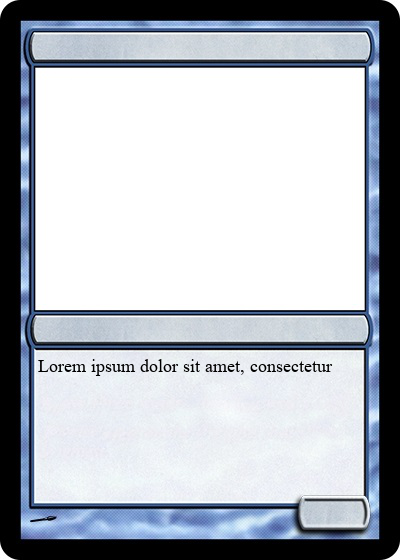

In [38]:
write_text(
    image=card,
    text=lorem_wrapped[0],
    font=text_font,
    x=text_area_x,
    y=text_area_y
)

In [39]:
def write_multiline_text(image, multiline_text, font, x, y):
    image = image.copy()
    draw = ImageDraw.Draw(image)
    draw.multiline_text((x,y), multiline_text, font=font, fill='black', spacing=4)
    return image

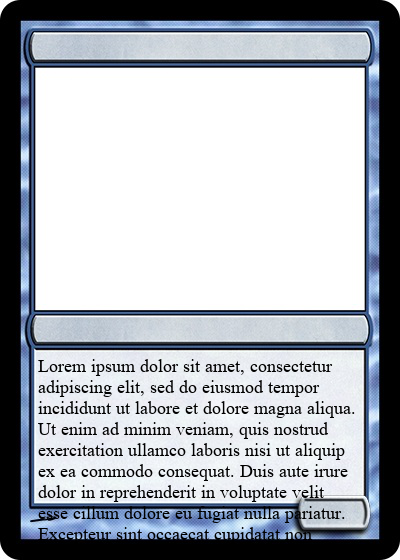

In [40]:
write_multiline_text(
    image=card,
    multiline_text="\n".join(lorem_wrapped), 
    font=text_font,
    x=text_area_x,
    y=text_area_y
)

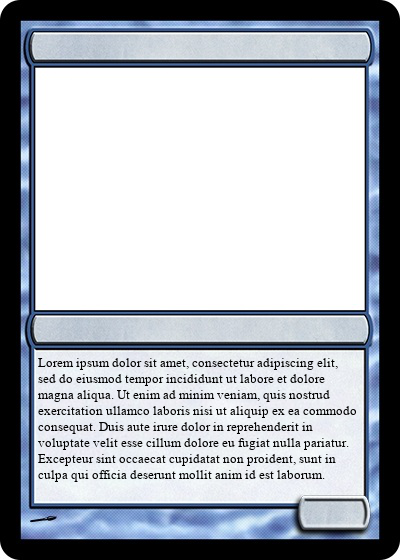

In [41]:
lorem_font = ImageFont.truetype("assets/fonts/text.ttf", 13)
lorem_wrapped = wrap_multiline_text(lorem, lorem_font, text_area_width)

write_multiline_text(
    image=card,
    multiline_text="\n".join(lorem_wrapped), 
    font=lorem_font,
    x=text_area_x,
    y=text_area_y
)

In [42]:
def get_multiline_text_height(multiline_text, font):
    draw = ImageDraw.Draw(Image.new('RGB', (0,0)))

    text_bb = draw.multiline_textbbox(
        xy=(0,0),
        text=multiline_text,
        font=font
    )

    multiline_text_height = text_bb[3] - text_bb[1]

    return multiline_text_height

In [43]:
get_multiline_text_height("\n".join(lorem_wrapped), lorem_font)

124

In [44]:
def get_fitting_text_and_font(text, max_width, max_height, font_file, min_font_size, max_font_size):
    for font_size in range(max_font_size, min_font_size, -1):

        font = ImageFont.truetype(font_file, font_size)

        wrapped_text = wrap_multiline_text(text, font, max_width)
        multiline_text = "\n".join(wrapped_text)

        multiline_text_height = get_multiline_text_height(multiline_text, font)

        if multiline_text_height < max_height:
            break

    return multiline_text, font

In [45]:
fit_text, fit_font = get_fitting_text_and_font(
    lorem[:100], 
    text_area_width, 
    text_area_height, 
    "assets/fonts/text.ttf",
    8,
    20
)

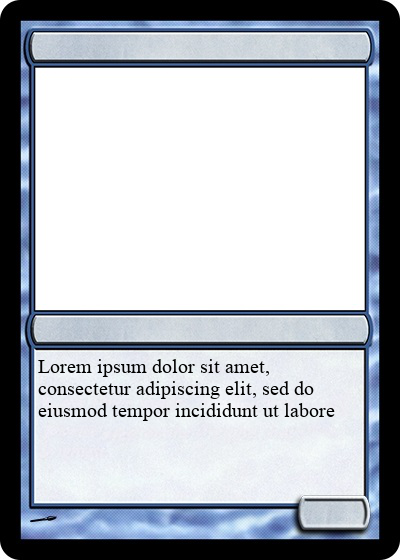

In [46]:
write_multiline_text(
    image=card,
    multiline_text=fit_text, 
    font=fit_font,
    x=text_area_x,
    y=text_area_y
)

In [47]:
def get_center_y_anchor_offset(height, max_height):
    y_offset = (max_height - height) / 2
    return max(0, y_offset)

In [48]:
fit_text, fit_font = get_fitting_text_and_font(
    lorem, 
    text_area_width, 
    text_area_height, 
    "assets/fonts/text.ttf",
    8,
    20
)

text_height = get_multiline_text_height(fit_text, fit_font)
text_height

124

In [49]:
y_offset = get_center_y_anchor_offset(text_height, text_area_height)
y_offset

5.5

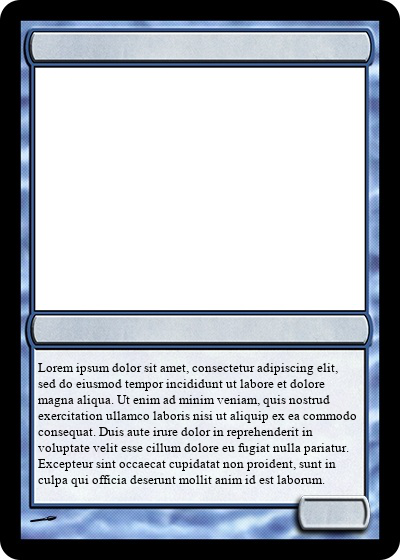

In [50]:
write_multiline_text(
    image=card,
    multiline_text=fit_text, 
    font=fit_font,
    x=text_area_x,
    y=text_area_y + y_offset
)

In [51]:
def write_text_centered_within_box(image, text, x, y, max_width, max_height, font_file, min_font_size, max_font_size):
    fit_text, fit_font = get_fitting_text_and_font(text, max_width, max_height, font_file,min_font_size,max_font_size)
    text_height = get_multiline_text_height(fit_text, fit_font)
    y_offset = get_center_y_anchor_offset(text_height, max_height)
    return write_multiline_text(
        image=image,
        multiline_text=fit_text, 
        font=fit_font,
        x=x,
        y=y + y_offset
    )

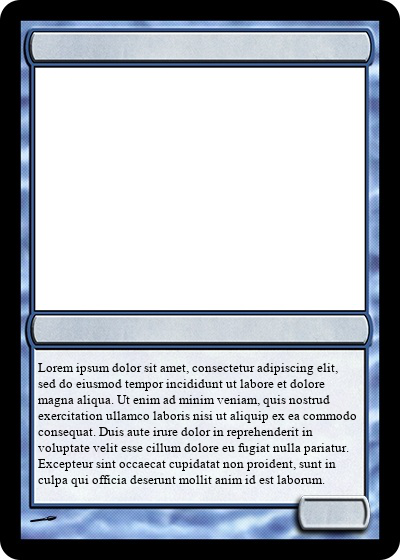

In [52]:
write_text_centered_within_box(card, lorem, text_area_x, text_area_y, text_area_width, text_area_height, "assets/fonts/text.ttf", 8, 18)

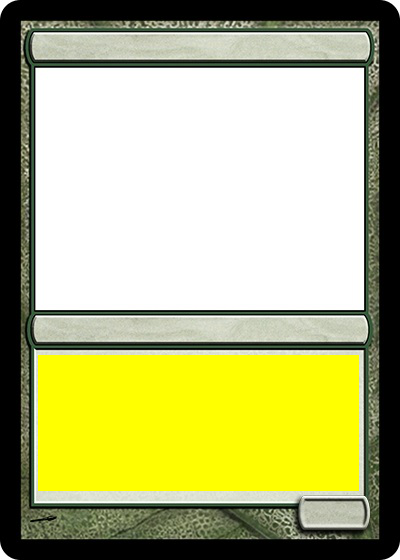

In [53]:
test_card = load_blank_card("green", False)

text_area_x = 38
text_area_y = 355

text_area_width = 320
text_area_height = 135

draw_rectangle(test_card, x=text_area_x, y=text_area_y, width=text_area_width, height=text_area_height, color="yellow")

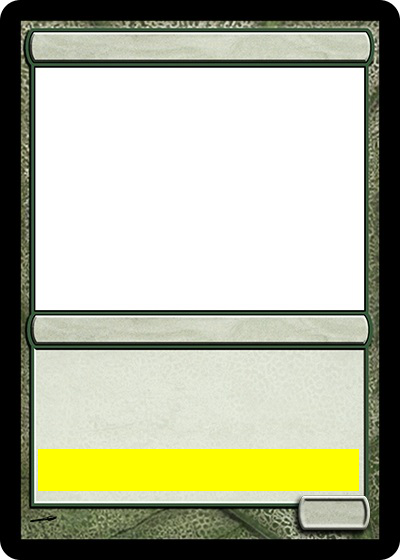

In [54]:
draw_rectangle(test_card, x=text_area_x, y=text_area_y + text_area_height*0.7, width=text_area_width, height=text_area_height*0.3, color="yellow")

In [55]:
def write_card_text_and_flavor(card, ability_text, flavor_text):

    total_text_area_width = 321
    total_text_area_height = 136

    total_text_area_x = 38
    total_text_area_y = 355

    if ability_text:
        if flavor_text:
            ability_proportion = 0.7
        else:
            ability_proportion = 1.0
    else:
        ability_proportion = 0.0

    ability_text_y = total_text_area_y
    ability_text_height = total_text_area_height * ability_proportion

    flavor_text_y = ability_text_y + ability_text_height
    flavor_text_height = total_text_area_height - ability_text_height

    if ability_text:
        card = write_text_centered_within_box(
            card,
            ability_text,
            total_text_area_x,
            ability_text_y,
            total_text_area_width,
            ability_text_height,
            "assets/fonts/text.ttf", 10, 18
        )

    if flavor_text:
        card = write_text_centered_within_box(
            card,
            flavor_text,
            total_text_area_x,
            flavor_text_y,
            total_text_area_width,
            flavor_text_height,
            "assets/fonts/flavor_text.ttf", 8, 14
        )

    return card

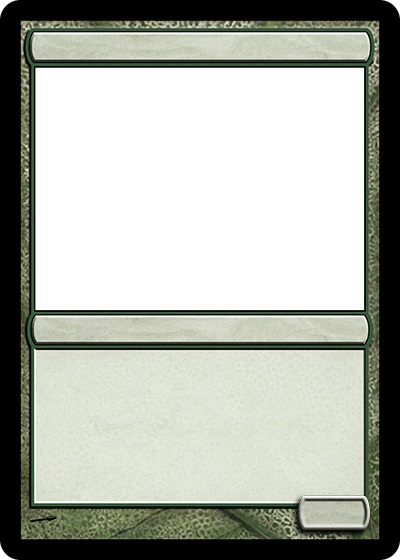

In [56]:
test_card

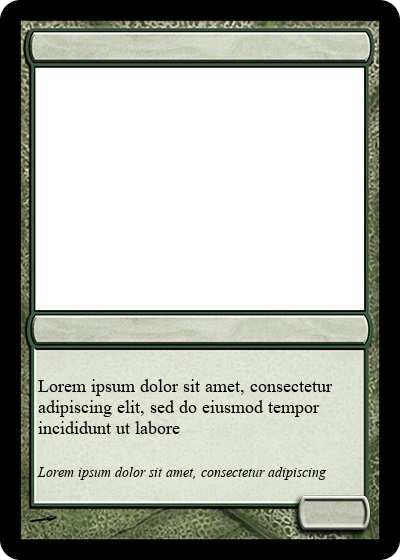

In [57]:
write_card_text_and_flavor(test_card, lorem[:100], lorem[:50])

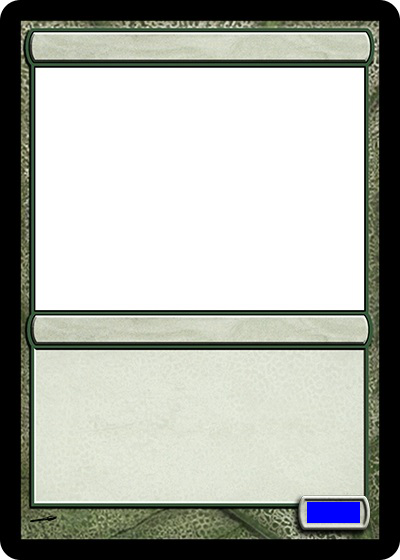

In [58]:
draw_rectangle(test_card, x=307, y=502, width=52, height=20, color="blue")

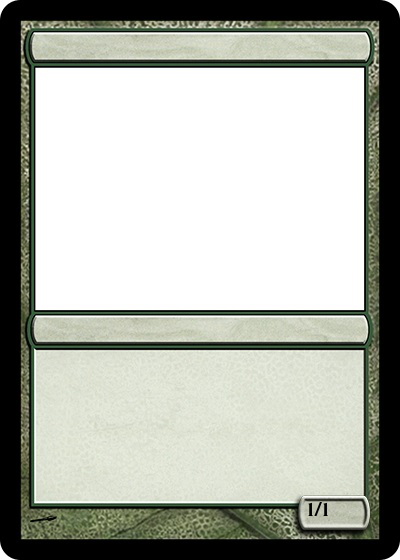

In [59]:
power_toughness_font = ImageFont.truetype("assets/fonts/power_toughness.ttf", 22)

write_text(test_card, "1/1", font=power_toughness_font, x=307, y=502)

In [60]:
def write_text_centered(image, text, font, x, y, width):
    text_width = get_text_width(text, font)

    x_offset = (width - text_width) / 2

    image = write_text(
        image=image,
        text=text,
        font=font,
        x=x+x_offset,
        y=y
    )

    return image

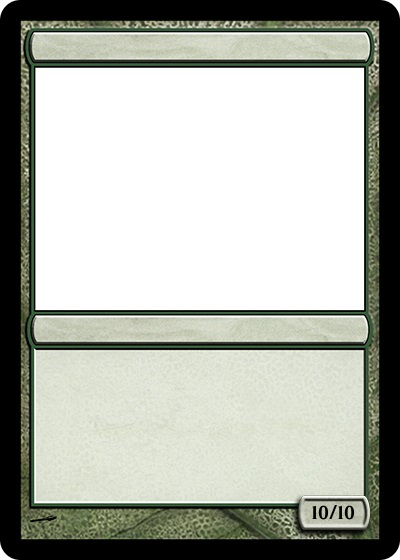

In [61]:
write_text_centered(test_card, "10/10", font=power_toughness_font, x=307, y=505, width=52)

In [62]:
def write_card_power_and_toughness(card, power, toughness):
    return write_text_centered(
        card, 
        f"{power}/{toughness}", 
        font=ImageFont.truetype("assets/fonts/power_toughness.ttf", 22), 
        x=307, 
        y=505, 
        width=52
    )

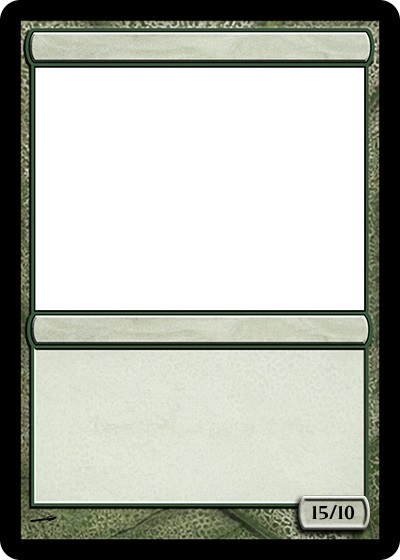

In [63]:
write_card_power_and_toughness(test_card, 15, 10)

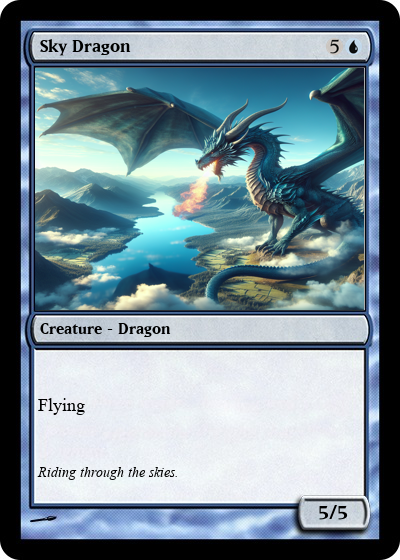

In [336]:
rendered_card = load_blank_card("blue", non_creature=False)
rendered_card = draw_manas(rendered_card, ["5", "U"])
rendered_card = insert_illustration(rendered_card, illustration)
rendered_card = write_card_name(rendered_card, "Sky Dragon")
rendered_card = write_card_type(rendered_card, "Creature - Dragon")
rendered_card = write_card_text_and_flavor(rendered_card, "Flying", "Riding through the skies.")
rendered_card = write_card_power_and_toughness(rendered_card, 5, 5)

rendered_card

In [337]:
def render_card(color, non_creature, manas, illustration, name, type, ability_text, flavor_text, power, toughness):

    rendered_card = load_blank_card(color, non_creature=non_creature)
    rendered_card = draw_manas(rendered_card, manas)
    rendered_card = insert_illustration(rendered_card, illustration)
    rendered_card = write_card_name(rendered_card, name)
    rendered_card = write_card_type(rendered_card, type)
    rendered_card = write_card_text_and_flavor(rendered_card, ability_text, flavor_text)
    
    if not non_creature:
        rendered_card = write_card_power_and_toughness(rendered_card, power, toughness)

    return rendered_card

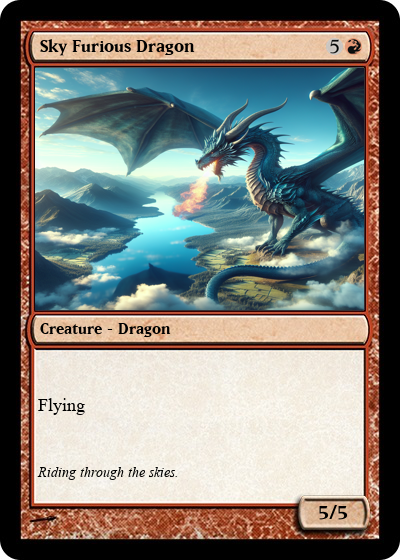

In [341]:
render_card(
    color="red", 
    non_creature=False, 
    manas=["5", "R"], 
    illustration=illustration, 
    name="Sky Furious Dragon", 
    type="Creature - Dragon", 
    ability_text="Flying", 
    flavor_text="Riding through the skies.", 
    power=5, 
    toughness=5
)

In [342]:
def generate_card(card_name):
    card_illustration = get_card_illustration(card_name)
    card_parameters = get_card_parameters(card_name)

    return render_card(
        color=card_parameters["color"] or "", 
        non_creature=card_parameters["non_creature"] or False, 
        manas=card_parameters["cost"] or [], 
        illustration=card_illustration, 
        name=card_parameters["name"]  or "", 
        type=card_parameters["type"]  or "", 
        ability_text=card_parameters["text"]  or "", 
        flavor_text=card_parameters["flavor_text"]  or "", 
        power=card_parameters["power"] or 0, 
        toughness=card_parameters["toughness"]  or 0
    )

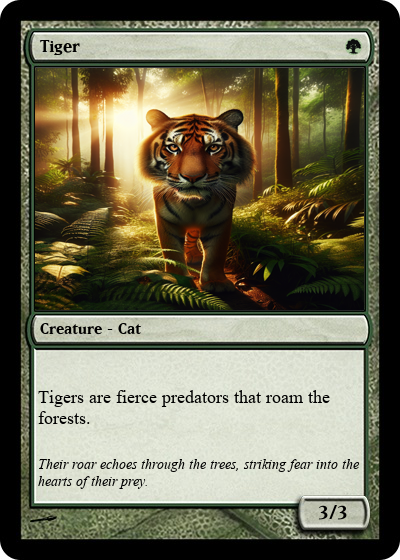

In [343]:
generate_card("Tiger")

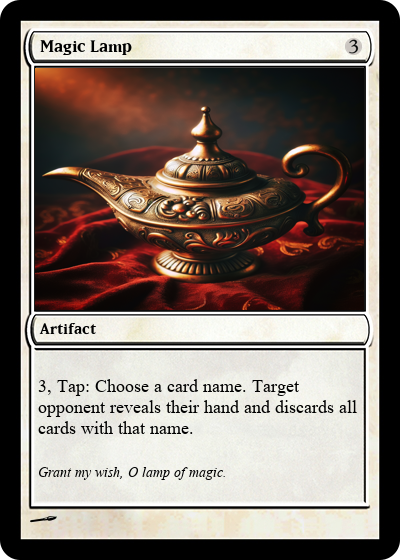

In [344]:
generate_card("Magic Lamp")

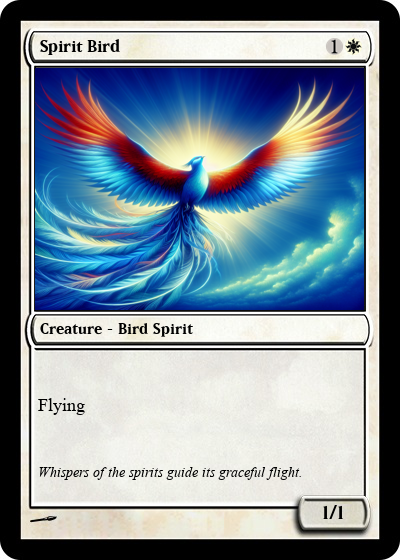

In [345]:
generate_card("Spirit Bird")

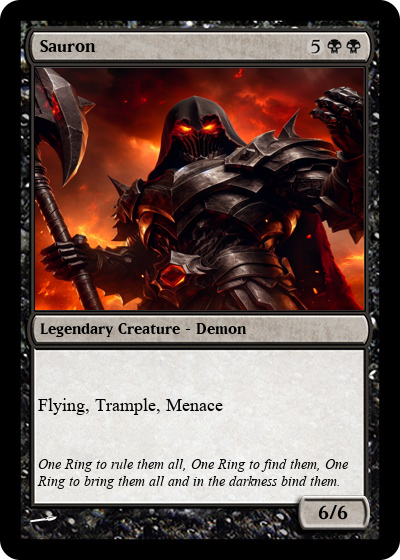

In [347]:
generate_card("Sauron")

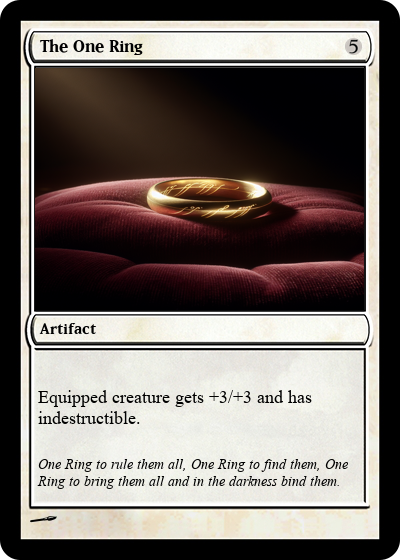

In [348]:
generate_card("The One Ring")

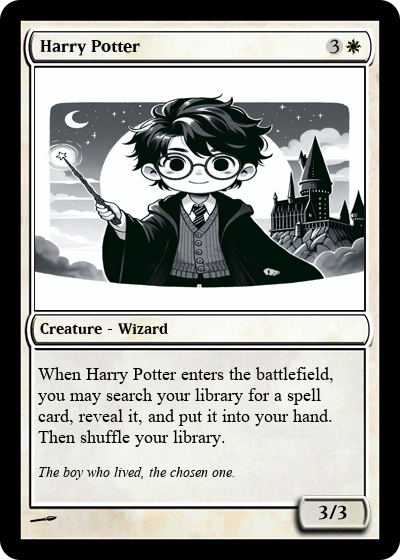

In [349]:
generate_card("Harry Potter")